In [0]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from  tensorflow.keras.layers import Input, Conv2D, MaxPool2D, Flatten, Dense, Conv2DTranspose, Reshape, UpSampling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam

from PIL import Image
import os
import cv2
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
!nvidia-smi


Wed Nov 20 22:57:16 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 430.50       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    59W / 149W |   2155MiB / 11441MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
!unzip /content/drive/My\ Drive/CV_project/img_align_celeba_mustache_png.zip

Archive:  /content/drive/My Drive/CV_project/img_align_celeba_mustache_png.zip
replace img_align_celeba_mustache_png/000314.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: img_align_celeba_mustache_png/000314.png  
  inflating: img_align_celeba_mustache_png/000797.png  
  inflating: img_align_celeba_mustache_png/001022.png  
  inflating: img_align_celeba_mustache_png/001257.png  
  inflating: img_align_celeba_mustache_png/001474.png  
  inflating: img_align_celeba_mustache_png/002227.png  
  inflating: img_align_celeba_mustache_png/002259.png  
  inflating: img_align_celeba_mustache_png/002281.png  
  inflating: img_align_celeba_mustache_png/002477.png  
  inflating: img_align_celeba_mustache_png/002574.png  
  inflating: img_align_celeba_mustache_png/002644.png  
  inflating: img_align_celeba_mustache_png/002768.png  
  inflating: img_align_celeba_mustache_png/002898.png  
  inflating: img_align_celeba_mustache_png/003035.png  
  inflating: img_align_celeba_mustache_png/0030

In [0]:
!cp img_align_celeba_mustache_png/189717.png test/

In [0]:
def channel_wise_fc_layer(input, name): # bottom: (7x7x512)
    _, width, height, n_feat_map = input.get_shape().as_list()
    input_reshape = tf.reshape( input, [-1, width*height, n_feat_map] )
    input_transpose = tf.transpose( input_reshape, [2,0,1] )

    # with tf.variable_scope(name):
    #     W = tf.get_variable(
    #             "W",
    #             shape=[n_feat_map,width*height, width*height], # (512,49,49)
    #             initializer=tf.random_normal_initializer(0., 0.005))
    #     output = tf.batch_matmul(input_transpose, W)

    W = tf.Variable(shape=tf.ones(shape=[n_feat_map,width*height, width*height]), name="W")
    output = tf.matmul(input_transpose, W)

    output_transpose = tf.transpose(output, [1,2,0])
    output_reshape = tf.reshape( output_transpose, [-1, height, width, n_feat_map] )

    return output_reshape

In [0]:
class ChannelWiseFCLayer(tf.keras.layers.Layer):
    def __init__(self):
        super(ChannelWiseFCLayer, self).__init__()
    
    def build(self, input_shape):
        height = 6
        width = 6
        n_feat_map = 256
        #     W = tf.get_variable(
        #             "W",
        #             shape=[n_feat_map,width*height, width*height], # (512,49,49)
        #             initializer=tf.random_normal_initializer(0., 0.005))
        shape = [n_feat_map, width * height, width * height]
        self.W = tf.Variable(tf.random.normal(shape,0., 0.005), shape=[n_feat_map, width * height, width * height], name="W")

    def call(self, input):
        width = 6
        height = 6
        n_feat_map = 256
        input_reshape = tf.reshape(input, [-1, width * height, n_feat_map])
        input_transpose = tf.transpose(input_reshape, [2,0,1])

        output = tf.matmul(input_transpose, self.W)

        output_transpose = tf.transpose(output, [1,2,0])
        output_reshape = tf.reshape(output_transpose, [-1, height, width, n_feat_map])

        return output_reshape

    def get_config(self):
        return {}

In [0]:
# Encoder
#1st layer
input = Input((227,227,3))
x = Conv2D(filters = 96, kernel_size=(11,11), strides = (4,4), activation='relu')(input)
x = MaxPool2D(pool_size=(3,3), strides=(2,2))(x)
#2nd layer
x = Conv2D(filters = 256, kernel_size=(5,5),strides = (1,1), padding='same', activation='relu')(x)
x = MaxPool2D(pool_size=(3,3), strides=(2,2),)(x)
#3rd layer
x = Conv2D(filters = 384, kernel_size=(3,3),strides = (1,1),padding='same', activation='relu')(x)
#4th layer
x = Conv2D(filters = 384, kernel_size=(3,3),strides = (1,1),padding='same', activation='relu')(x)
#5th layer
x = Conv2D(filters = 256, kernel_size=(3,3),strides = (1,1),padding='same', activation='relu')(x)
x = MaxPool2D(pool_size=(3,3), strides=(2,2))(x)

# Channel-wise Fully Connected
# print(x.shape)
# x = Flatten()(x)
# print(x.shape)
# x = Dense(9216)(x)
# print(x.shape)
# x  = Reshape((6,6,256))(x)
# print(x.shape)

print(x.shape)
x = ChannelWiseFCLayer()(x)
print(x.shape)

# Decoder
x = Conv2DTranspose(filters = 128, kernel_size=(5,5), strides = 2, padding='same')(x)
x = BatchNormalization(axis=-1)(x)
x = Conv2DTranspose(filters = 64, kernel_size=(5,5), strides = 2, padding='same')(x)
x = BatchNormalization(axis=-1)(x)
x = Conv2DTranspose(filters = 64, kernel_size=(5,5), strides = 2, padding='same' )(x)
x = BatchNormalization(axis=-1)(x)
x = Conv2DTranspose(filters = 32, kernel_size=(5,5), strides = 2, padding='same',)(x)
x = BatchNormalization(axis=-1)(x)
x = Conv2DTranspose(filters = 3, kernel_size=(5,5), strides = 2, padding='same' )(x)
x = BatchNormalization(axis=-1)(x)
x = tf.image.resize(x, size=(227,227))

Generator = Model(inputs=input, outputs=x)



(None, 6, 6, 256)
(None, 6, 6, 256)


In [0]:
Generator.save('gen1.h5')


generator = load_model('gen1.h5', custom_objects={'ChannelWiseFCLayer' : ChannelWiseFCLayer})
generator.summary()

Model: "model_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_83 (InputLayer)        [(None, 227, 227, 3)]     0         
_________________________________________________________________
conv2d_370 (Conv2D)          (None, 55, 55, 96)        34944     
_________________________________________________________________
max_pooling2d_186 (MaxPoolin (None, 27, 27, 96)        0         
_________________________________________________________________
conv2d_371 (Conv2D)          (None, 27, 27, 256)       614656    
_________________________________________________________________
max_pooling2d_187 (MaxPoolin (None, 13, 13, 256)       0         
_________________________________________________________________
conv2d_372 (Conv2D)          (None, 13, 13, 384)       885120    
_________________________________________________________________
conv2d_373 (Conv2D)          (None, 13, 13, 384)       132

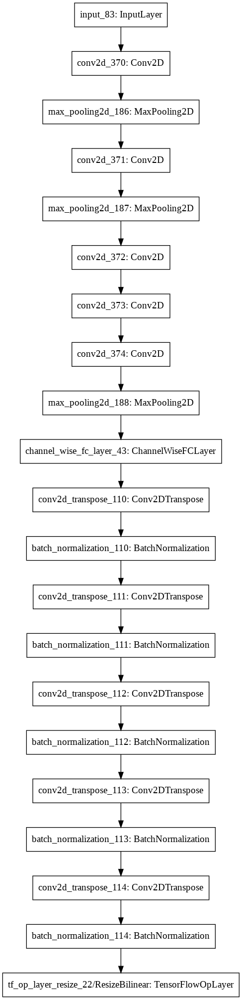

In [0]:
import tensorflow as tf
tf.keras.utils.plot_model(Generator, to_file='model_combined.png')

In [0]:
input_discriminator = Input((227,227,3))
dis = Conv2D(filters = 96, kernel_size=(4,4), strides = (2,2), activation='relu')(input_discriminator)
dis = Conv2D(filters = 96, kernel_size=(4,4), strides = (2,2), activation='relu')(dis)
dis = Conv2D(filters = 96, kernel_size=(4,4), strides = (2,2), activation='relu')(dis)
dis = Conv2D(filters = 128, kernel_size=(4,4), strides = (1,1), activation='relu')(dis)
dis = Conv2D(filters = 256, kernel_size=(4,4), strides = (2,2), activation='relu')(dis)
dis = Conv2D(filters = 512, kernel_size=(4,4), strides = (2,2), activation='relu')(dis)
dis = Flatten()(dis)
dis = Dense(1, activation='sigmoid')(dis)
Discriminator = Model(inputs=input_discriminator, outputs=dis)


In [0]:
optimizer = Adam(0.0002, 0.5)

Discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
Discriminator.trainable = False

masked_img = Input(shape=(227,227,3))
gen_masked = Generator(masked_img)


# The discriminator takes generated images as input and determines
# if it is generated or if it is a real image
valid = Discriminator(gen_masked)

# The combined model  (stacked generator and discriminator)
# Trains generator to fool discriminator
combined_model = Model(masked_img , [gen_masked, valid])
combined_model.compile(loss=['mse', 'binary_crossentropy'], loss_weights=[0.999, 0.001], optimizer=optimizer)



In [0]:
class DataStorage:
    def __init__(self, images_path, batch_size=8, mode='test', target_size=(227, 227), mask_size=(64, 64)):
      self.batch_size = batch_size
      self.target_size = target_size
      self.mask_size = mask_size
      self.mode = mode
      
      self.filepaths = []
      for filepath in os.listdir(images_path):
        if filepath.endswith('.png'):
          self.filepaths.append(os.path.join(images_path, filepath))

      self.mouth_positions = dict()
      with open('mouth_positions.txt', 'r') as f:
        for line in f:
          s = line.strip().split()
          for i in range(1, len(s)):
            s[i] = int(s[i])
          # filename lefteye_x lefteye_y righteye_x righteye_y nose_x nose_y leftmouth_x leftmouth_y rightmouth_x rightmouth_y
          filename = '{}.png'.format(s[0].split('.')[0])
          leftmouth_x, leftmouth_y, rightmouth_x, rightmouth_y = s[-4], s[-3], s[-2], s[-1]
          self.mouth_positions[os.path.join(images_path, filename)] = (leftmouth_x, leftmouth_y, rightmouth_x, rightmouth_y)

      self.batches_count = (len(self.filepaths) + batch_size - 1) // batch_size
      self.next_batch_start_index = 0

    def get_batches_count(self):
      return self.batches_count

    def get_next_batch(self):
      masked_images = []
      masked_parts = []
      y_ranges = []
      x_ranges = []
      images = []
      for imagepath in self.filepaths[self.next_batch_start_index : min(self.next_batch_start_index + self.batch_size, len(self.filepaths))]:
        if self.mode == 'random_mustache_mask':
          img, mi, mp, y_range, x_range = self.make_random_mustache_mask(imagepath)
        elif self.mode == 'mustache':
          img, mi, mp, y_range, x_range = self.make_mustache_mask(imagepath)
        elif self.mode == 'center':
          img, mi, mp, y_range, x_range = self.make_center_mask(imagepath)
        elif self.mode == 'random':
          img, mi, mp, y_range, x_range = self.make_random_mustache_mask_1(imagepath)
        masked_images.append(mi)
        masked_parts.append(mp)
        y_ranges.append(y_range)
        x_ranges.append(x_range)
        images.append(img)
        self.next_batch_start_index = (self.next_batch_start_index + self.batch_size) % len(self.filepaths)
      return images, masked_images, masked_parts, y_ranges, x_ranges

    def make_random_mustache_mask(self, filepath):
      image = cv2.imread(filepath)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      leftmouth_x, leftmouth_y, rightmouth_x, rightmouth_y = self.mouth_positions[filepath]

      x_mouth_center = (leftmouth_x + rightmouth_x) // 2
      y_mouth_center = (leftmouth_y + rightmouth_y) // 2

      mask_size = self.mask_size

      dy = np.random.randint(-y_mouth_center, image.shape[0] - y_mouth_center - mask_size[0])
      dy = max(-mask_size[0], dy)
      dy = min(mask_size[0], dy)

      dx = np.random.randint(-x_mouth_center, image.shape[1] - x_mouth_center - mask_size[1])
      dx = max(-mask_size[1], dx)
      dx = min(mask_size[1], dx)

      y_range = (y_mouth_center + dy, y_mouth_center + dy + mask_size[0])
      x_range = (x_mouth_center + dx, x_mouth_center + dx + mask_size[1])

      masked_image = image.copy()

      scaleY = self.target_size[0] / image.shape[0]
      scaleX = self.target_size[1] / image.shape[1]

      y_range = (int(y_range[0] * scaleY), int(y_range[1] * scaleY))
      x_range = (int(x_range[0] * scaleX), int(x_range[1] * scaleX))

      masked_image = cv2.resize(masked_image, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_image[y_range[0]:y_range[1], x_range[0]:x_range[1], :] = 255

      masked_image = masked_image / 255
      masked_image = (masked_image - 0.5) / 0.5

      masked_part = image.copy()
      masked_part = cv2.resize(masked_part, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_part[0:y_range[0], :, :] = 255
      masked_part[y_range[1]:, :, :] = 255
      masked_part[:, 0:x_range[0], :] = 255
      masked_part[:, x_range[1]:, :] = 255

      masked_part = masked_part / 255
      masked_part = (masked_part - 0.5) / 0.5

      return cv2.resize(image.copy(), dsize=self.target_size, interpolation=cv2.INTER_CUBIC), masked_image, masked_part, y_range, x_range

    def make_mustache_mask(self, filepath):
      image = cv2.imread(filepath)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      leftmouth_x, leftmouth_y, rightmouth_x, rightmouth_y = self.mouth_positions[filepath]
      hor_padding = 10
      ver_padding = 10

      x_left, x_right = min(leftmouth_x, rightmouth_x), max(leftmouth_x, rightmouth_x)
      x_left -= hor_padding
      x_right += hor_padding

      y_upper, y_lower = min(leftmouth_y, rightmouth_y), max(leftmouth_y, rightmouth_y)
      y_upper -= ver_padding
      y_lower += ver_padding

      scaleY = self.target_size[0] / image.shape[0]
      scaleX = self.target_size[1] / image.shape[1]

      y_range = (int(y_upper * scaleY), int(y_lower * scaleY))
      x_range = (int(x_left * scaleX), int(x_right * scaleX))

      masked_image = image.copy()
      masked_image = cv2.resize(masked_image, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_image[y_range[0]:y_range[1], x_range[0]:x_range[1], :] = 255

      masked_image = masked_image / 255
      masked_image = (masked_image - 0.5) / 0.5


      masked_part = image.copy()
      masked_part = cv2.resize(masked_part, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_part[0:y_range[0], :, :] = 255
      masked_part[y_range[1]:, :, :] = 255
      masked_part[:, 0:x_range[0], :] = 255
      masked_part[:, x_range[1]:, :] = 255

      masked_part = masked_part / 255
      masked_part = (masked_part - 0.5) / 0.5

      return cv2.resize(image.copy(), dsize=self.target_size, interpolation=cv2.INTER_CUBIC), masked_image, masked_part, y_range, x_range

    def make_center_mask(self, filepath):
      image = cv2.imread(filepath)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.resize(image, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_image = image.copy()
      y_upper, x_left = image.shape[0] // 2 - self.mask_size[0] // 2, image.shape[1] // 2 - self.mask_size[1] // 2

      y_range = (y_upper, y_upper + self.mask_size[0])
      x_range = (x_left, x_left + self.mask_size[1])

      masked_image[y_range[0]:y_range[1], x_range[0]:x_range[1], :] = 255

      masked_image = masked_image / 255
      masked_image = (masked_image - 0.5) / 0.5

      masked_part = image.copy()
      masked_part = cv2.resize(masked_part, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      masked_part[0:y_range[0], :, :] = 255
      masked_part[y_range[1]:, :, :] = 255
      masked_part[:, 0:x_range[0], :] = 255
      masked_part[:, x_range[1]:, :] = 255

      masked_part = masked_part / 255
      masked_part = (masked_part - 0.5) / 0.5

      return cv2.resize(image.copy(), dsize=self.target_size, interpolation=cv2.INTER_CUBIC), masked_image, masked_part, y_range, x_range

    def make_random_mustache_mask_1(self, filepath):
      image = cv2.imread(filepath)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.resize(image, dsize=self.target_size, interpolation=cv2.INTER_CUBIC)

      mask_size = self.mask_size

      x_range = sorted(np.random.randint(0, image.shape[1] - mask_size[1], 2))
      y_range = sorted(np.random.randint(0, image.shape[0] - mask_size[0], 2))

      masked_image = image.copy()


      masked_image[y_range[0]:y_range[1], x_range[0]:x_range[1], :] = 255

      masked_image = masked_image / 255
      masked_image = (masked_image - 0.5) / 0.5

      masked_part = image.copy()

      masked_part[0:y_range[0], :, :] = 255
      masked_part[y_range[1]:, :, :] = 255
      masked_part[:, 0:x_range[0], :] = 255
      masked_part[:, x_range[1]:, :] = 255

      masked_part = masked_part / 255
      masked_part = (masked_part - 0.5) / 0.5

      return image, masked_image, masked_part, y_range, x_range

In [0]:
def showInRow(list_of_images, titles = None):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])
      
    img = list_of_images[idx]
    
    subplot.imshow(img)
  plt.show()

Model: "model_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_85 (InputLayer)        [(None, 227, 227, 3)]     0         
_________________________________________________________________
model_42 (Model)             (None, 227, 227, 3)       5260431   
_________________________________________________________________
model_43 (Model)             (None, 1)                 3126945   
Total params: 8,387,376
Trainable params: 5,259,849
Non-trainable params: 3,127,527
_________________________________________________________________
Epoch:0 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.721376, mse: 0.722098]
Epoch:0 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.725369, mse: 0.726095]
Epoch:0 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.578927, mse: 0.579506]
Epoch:0 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.570637, mse: 0.571208]
Epoch:0 

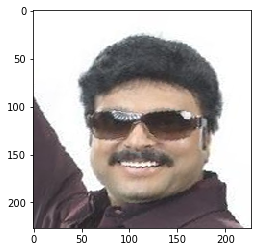

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


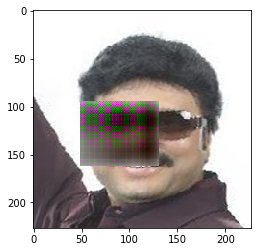

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


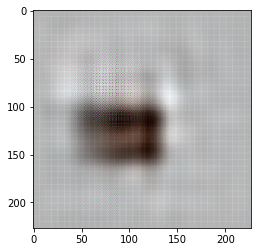

Epoch:1 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.350359, mse: 0.350710]
Epoch:1 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.322595, mse: 0.322918]
Epoch:1 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.319394, mse: 0.319714]
Epoch:1 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.307017, mse: 0.307324]
Epoch:1 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.267586, mse: 0.267854]
Epoch:1 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.287361, mse: 0.287649]
Epoch:1 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.238348, mse: 0.238586]
Epoch:1 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.261621, mse: 0.261883]
Epoch:1 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.252403, mse: 0.252656]
Epoch:1 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.210525, mse: 0.210736]
Epoch:1 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.231369, mse: 0.231600]


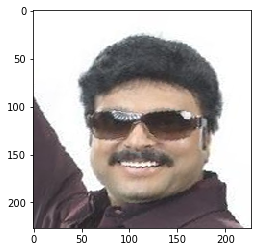

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


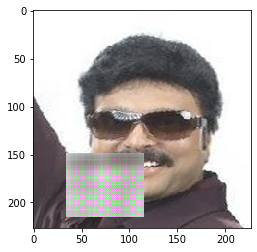

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


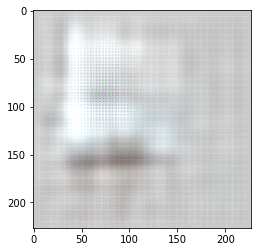

Epoch:2 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.180315, mse: 0.180495]
Epoch:2 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.203849, mse: 0.204053]
Epoch:2 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.186877, mse: 0.187064]
Epoch:2 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.162196, mse: 0.162358]
Epoch:2 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.164584, mse: 0.164748]
Epoch:2 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.134857, mse: 0.134992]
Epoch:2 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.095325, mse: 0.095420]
Epoch:2 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.089677, mse: 0.089767]
Epoch:2 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.118676, mse: 0.118795]
Epoch:2 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.073782, mse: 0.073856]
Epoch:2 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.083766, mse: 0.083850]


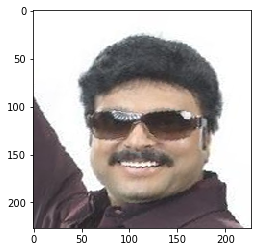

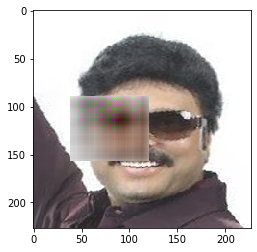

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


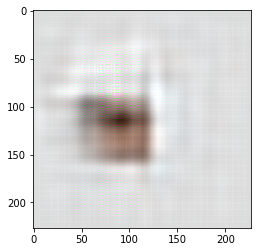

Epoch:3 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.098655, mse: 0.098753]
Epoch:3 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.068189, mse: 0.068257]
Epoch:3 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.089116, mse: 0.089205]
Epoch:3 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.066017, mse: 0.066083]
Epoch:3 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.074383, mse: 0.074458]
Epoch:3 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.068888, mse: 0.068957]
Epoch:3 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.052796, mse: 0.052849]
Epoch:3 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.060254, mse: 0.060314]
Epoch:3 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.047766, mse: 0.047813]
Epoch:3 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.037318, mse: 0.037356]
Epoch:3 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.046269, mse: 0.046315]


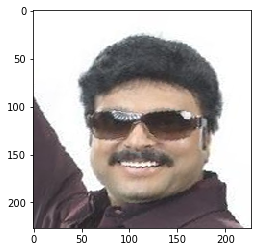

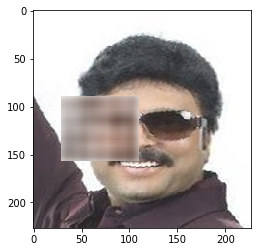

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


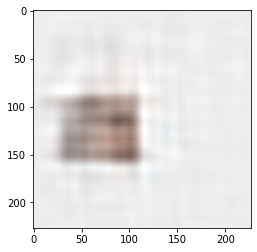

Epoch:4 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.034756, mse: 0.034791]
Epoch:4 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.031197, mse: 0.031228]
Epoch:4 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028196, mse: 0.028224]
Epoch:4 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.027227, mse: 0.027255]
Epoch:4 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.034455, mse: 0.034490]
Epoch:4 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028114, mse: 0.028142]
Epoch:4 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028826, mse: 0.028855]
Epoch:4 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.023017, mse: 0.023040]
Epoch:4 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022305, mse: 0.022328]
Epoch:4 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.020520, mse: 0.020541]
Epoch:4 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.026442, mse: 0.026469]


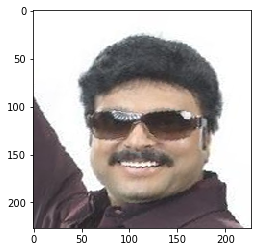

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


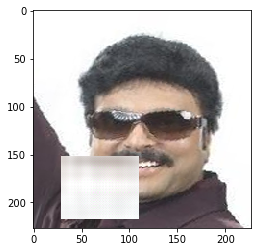

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


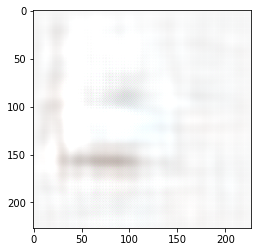

Epoch:5 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017803, mse: 0.017821]
Epoch:5 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019086, mse: 0.019105]
Epoch:5 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016185, mse: 0.016201]
Epoch:5 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021088, mse: 0.021109]
Epoch:5 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014686, mse: 0.014701]
Epoch:5 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016493, mse: 0.016509]
Epoch:5 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014355, mse: 0.014370]
Epoch:5 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.018936, mse: 0.018955]
Epoch:5 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015073, mse: 0.015088]
Epoch:5 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.018416, mse: 0.018434]
Epoch:5 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015379, mse: 0.015394]


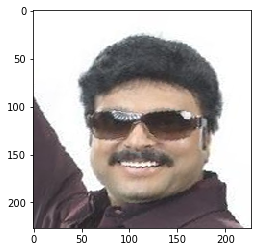

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


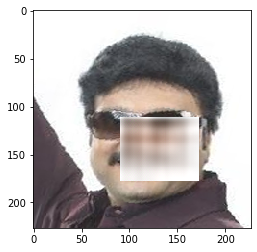

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


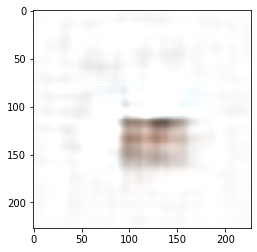

Epoch:6 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014757, mse: 0.014772]
Epoch:6 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.020657, mse: 0.020678]
Epoch:6 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013818, mse: 0.013831]
Epoch:6 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.033120, mse: 0.033153]
Epoch:6 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017454, mse: 0.017472]
Epoch:6 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.025919, mse: 0.025945]
Epoch:6 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.025247, mse: 0.025273]
Epoch:6 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012622, mse: 0.012634]
Epoch:6 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014999, mse: 0.015014]
Epoch:6 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017446, mse: 0.017464]
Epoch:6 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.026246, mse: 0.026272]


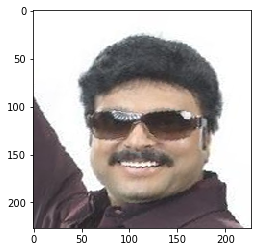

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


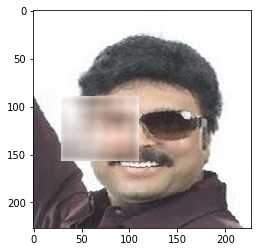

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


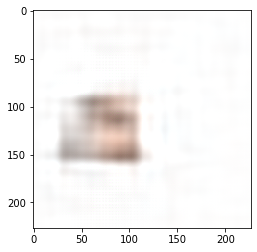

Epoch:7 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014037, mse: 0.014051]
Epoch:7 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011288, mse: 0.011299]
Epoch:7 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013911, mse: 0.013925]
Epoch:7 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022246, mse: 0.022269]
Epoch:7 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017860, mse: 0.017878]
Epoch:7 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017686, mse: 0.017703]
Epoch:7 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015042, mse: 0.015057]
Epoch:7 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011683, mse: 0.011695]
Epoch:7 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013254, mse: 0.013267]
Epoch:7 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012676, mse: 0.012689]
Epoch:7 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028875, mse: 0.028904]


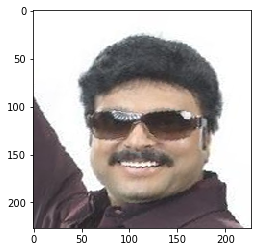

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


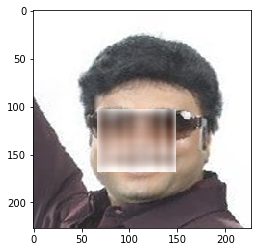

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


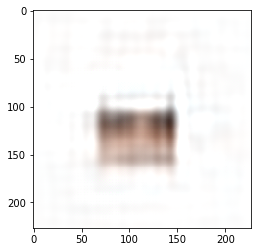

Epoch:8 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017805, mse: 0.017823]
Epoch:8 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021738, mse: 0.021760]
Epoch:8 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012410, mse: 0.012422]
Epoch:8 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012044, mse: 0.012056]
Epoch:8 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012121, mse: 0.012133]
Epoch:8 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014324, mse: 0.014339]
Epoch:8 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011795, mse: 0.011807]
Epoch:8 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012295, mse: 0.012307]
Epoch:8 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013756, mse: 0.013770]
Epoch:8 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.027675, mse: 0.027702]
Epoch:8 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013593, mse: 0.013607]


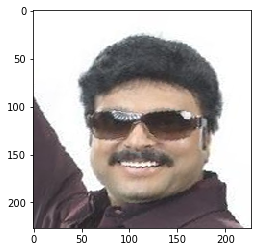

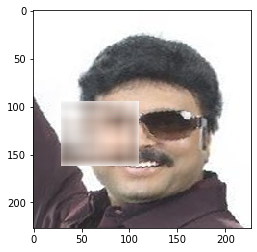

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


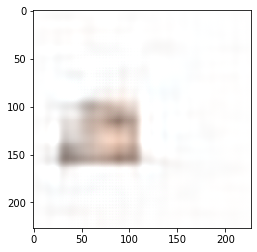

Epoch:9 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011885, mse: 0.011896]
Epoch:9 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.031973, mse: 0.032005]
Epoch:9 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012684, mse: 0.012696]
Epoch:9 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017914, mse: 0.017932]
Epoch:9 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011968, mse: 0.011980]
Epoch:9 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014577, mse: 0.014592]
Epoch:9 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014707, mse: 0.014722]
Epoch:9 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021093, mse: 0.021114]
Epoch:9 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013059, mse: 0.013072]
Epoch:9 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.025051, mse: 0.025076]
Epoch:9 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009149, mse: 0.009158]


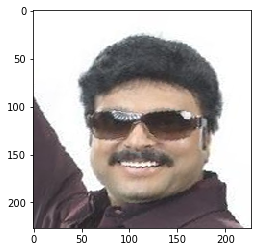

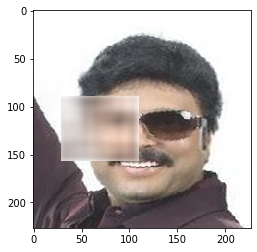

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


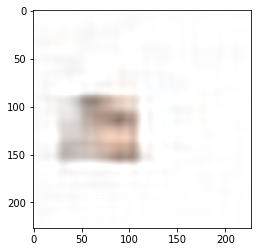

Epoch:10 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011990, mse: 0.012002]
Epoch:10 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.024293, mse: 0.024317]
Epoch:10 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012436, mse: 0.012449]
Epoch:10 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014555, mse: 0.014570]
Epoch:10 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022061, mse: 0.022083]
Epoch:10 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019551, mse: 0.019570]
Epoch:10 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012443, mse: 0.012455]
Epoch:10 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015017, mse: 0.015032]
Epoch:10 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013486, mse: 0.013500]
Epoch:10 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013265, mse: 0.013279]
Epoch:10 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014896, mse:

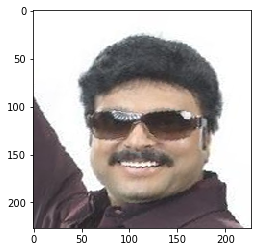

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


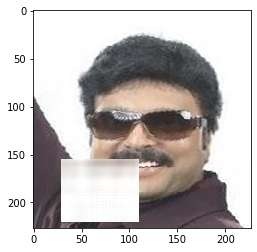

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


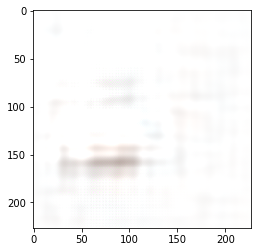

Epoch:11 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011205, mse: 0.011216]
Epoch:11 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015822, mse: 0.015838]
Epoch:11 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011959, mse: 0.011971]
Epoch:11 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013552, mse: 0.013565]
Epoch:11 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.018260, mse: 0.018279]
Epoch:11 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011843, mse: 0.011855]
Epoch:11 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.037855, mse: 0.037893]
Epoch:11 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012039, mse: 0.012051]
Epoch:11 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009810, mse: 0.009820]
Epoch:11 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009680, mse: 0.009690]
Epoch:11 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014107, mse:

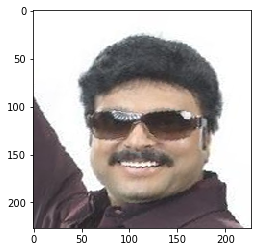

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


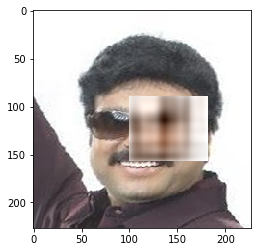

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


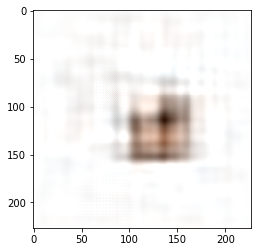

Epoch:12 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.024396, mse: 0.024420]
Epoch:12 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010899, mse: 0.010910]
Epoch:12 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010656, mse: 0.010667]
Epoch:12 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012422, mse: 0.012434]
Epoch:12 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012737, mse: 0.012750]
Epoch:12 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012220, mse: 0.012232]
Epoch:12 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.025072, mse: 0.025097]
Epoch:12 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013735, mse: 0.013749]
Epoch:12 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012740, mse: 0.012753]
Epoch:12 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013016, mse: 0.013029]
Epoch:12 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015347, mse:

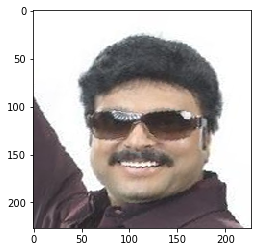

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


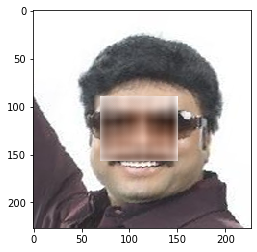

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


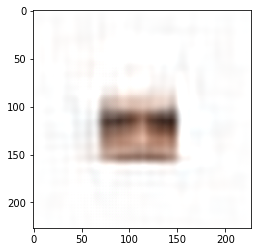

Epoch:13 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011173, mse: 0.011184]
Epoch:13 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.026335, mse: 0.026362]
Epoch:13 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011441, mse: 0.011452]
Epoch:13 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011602, mse: 0.011613]
Epoch:13 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013682, mse: 0.013696]
Epoch:13 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.037935, mse: 0.037973]
Epoch:13 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.024667, mse: 0.024691]
Epoch:13 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015046, mse: 0.015061]
Epoch:13 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011726, mse: 0.011738]
Epoch:13 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014762, mse: 0.014777]
Epoch:13 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011459, mse:

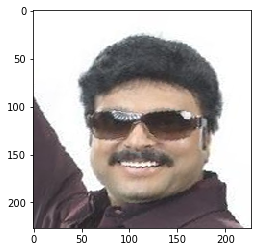

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


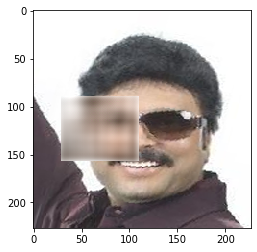

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


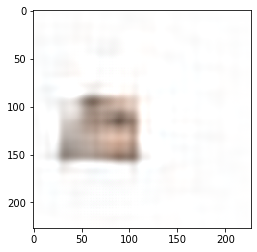

Epoch:14 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012314, mse: 0.012327]
Epoch:14 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013621, mse: 0.013634]
Epoch:14 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010272, mse: 0.010283]
Epoch:14 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011305, mse: 0.011317]
Epoch:14 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.024756, mse: 0.024781]
Epoch:14 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014538, mse: 0.014552]
Epoch:14 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015338, mse: 0.015353]
Epoch:14 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011142, mse: 0.011154]
Epoch:14 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011082, mse: 0.011093]
Epoch:14 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011329, mse: 0.011341]
Epoch:14 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012060, mse:

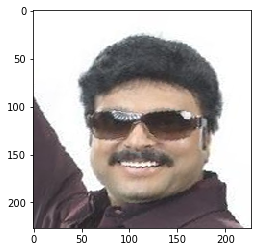

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


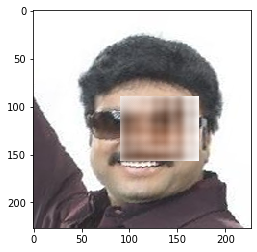

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


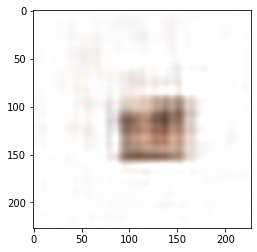

Epoch:15 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011087, mse: 0.011098]
Epoch:15 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013786, mse: 0.013800]
Epoch:15 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011872, mse: 0.011884]
Epoch:15 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011519, mse: 0.011530]
Epoch:15 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010489, mse: 0.010499]
Epoch:15 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010115, mse: 0.010126]
Epoch:15 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014254, mse: 0.014268]
Epoch:15 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012152, mse: 0.012164]
Epoch:15 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012420, mse: 0.012432]
Epoch:15 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012637, mse: 0.012650]
Epoch:15 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011520, mse:

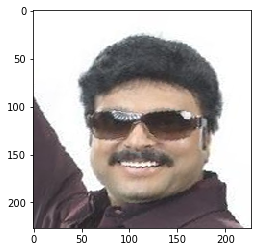

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


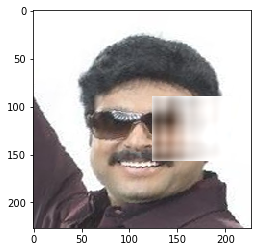

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


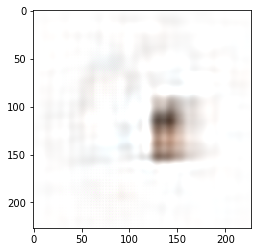

Epoch:16 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011326, mse: 0.011337]
Epoch:16 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012238, mse: 0.012250]
Epoch:16 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011937, mse: 0.011949]
Epoch:16 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013774, mse: 0.013788]
Epoch:16 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009161, mse: 0.009170]
Epoch:16 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013565, mse: 0.013578]
Epoch:16 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010139, mse: 0.010149]
Epoch:16 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009224, mse: 0.009233]
Epoch:16 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010234, mse: 0.010245]
Epoch:16 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012668, mse: 0.012681]
Epoch:16 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011630, mse:

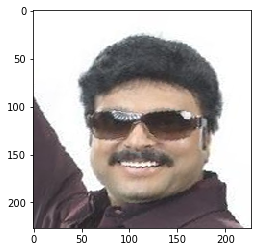

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


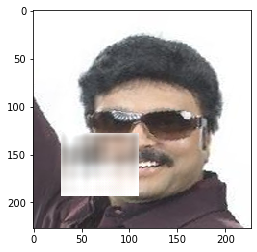

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


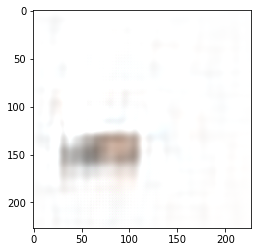

Epoch:17 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012033, mse: 0.012045]
Epoch:17 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016522, mse: 0.016538]
Epoch:17 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016978, mse: 0.016995]
Epoch:17 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009883, mse: 0.009893]
Epoch:17 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013888, mse: 0.013901]
Epoch:17 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010793, mse: 0.010804]
Epoch:17 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011363, mse: 0.011374]
Epoch:17 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022123, mse: 0.022145]
Epoch:17 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011989, mse: 0.012001]
Epoch:17 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014227, mse: 0.014242]
Epoch:17 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015768, mse:

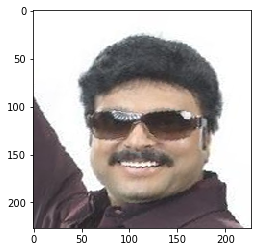

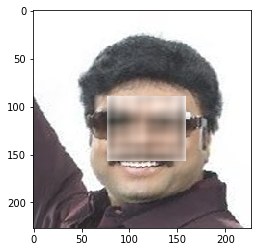

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


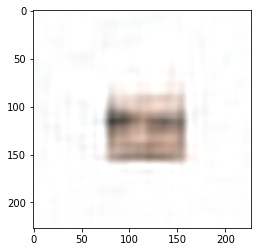

Epoch:18 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010042, mse: 0.010052]
Epoch:18 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011198, mse: 0.011209]
Epoch:18 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012067, mse: 0.012079]
Epoch:18 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.037360, mse: 0.037398]
Epoch:18 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009435, mse: 0.009445]
Epoch:18 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.032416, mse: 0.032448]
Epoch:18 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011260, mse: 0.011271]
Epoch:18 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012988, mse: 0.013001]
Epoch:18 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016292, mse: 0.016309]
Epoch:18 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010090, mse: 0.010100]
Epoch:18 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009907, mse:

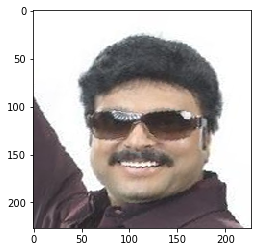

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


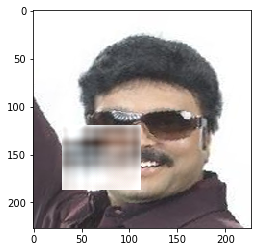

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


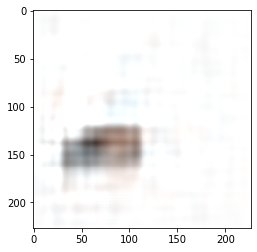

Epoch:19 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011349, mse: 0.011360]
Epoch:19 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010759, mse: 0.010770]
Epoch:19 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013889, mse: 0.013903]
Epoch:19 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013429, mse: 0.013443]
Epoch:19 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013043, mse: 0.013056]
Epoch:19 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011587, mse: 0.011599]
Epoch:19 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019368, mse: 0.019387]
Epoch:19 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011499, mse: 0.011510]
Epoch:19 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013313, mse: 0.013327]
Epoch:19 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009516, mse: 0.009526]
Epoch:19 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015580, mse:

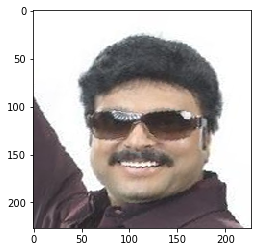

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


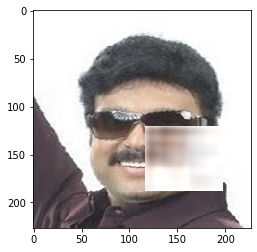

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


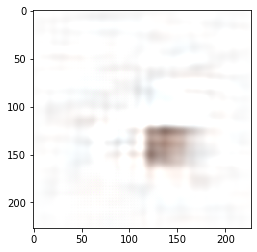

Epoch:20 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.029160, mse: 0.029189]
Epoch:20 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012792, mse: 0.012805]
Epoch:20 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011156, mse: 0.011167]
Epoch:20 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008303, mse: 0.008312]
Epoch:20 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011720, mse: 0.011732]
Epoch:20 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012801, mse: 0.012814]
Epoch:20 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012284, mse: 0.012296]
Epoch:20 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014599, mse: 0.014614]
Epoch:20 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012637, mse: 0.012649]
Epoch:20 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009602, mse: 0.009612]
Epoch:20 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012718, mse:

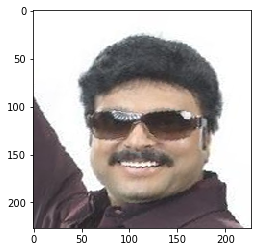

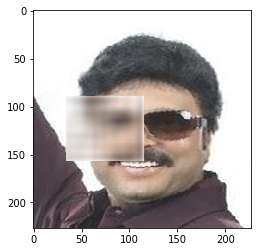

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


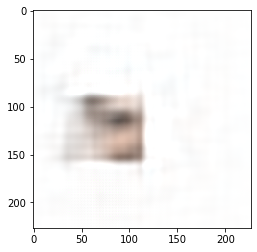

Epoch:21 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014164, mse: 0.014178]
Epoch:21 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013830, mse: 0.013844]
Epoch:21 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010723, mse: 0.010734]
Epoch:21 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011258, mse: 0.011269]
Epoch:21 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010382, mse: 0.010392]
Epoch:21 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011503, mse: 0.011514]
Epoch:21 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009912, mse: 0.009922]
Epoch:21 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010737, mse: 0.010747]
Epoch:21 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009160, mse: 0.009169]
Epoch:21 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009883, mse: 0.009893]
Epoch:21 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.048305, mse:

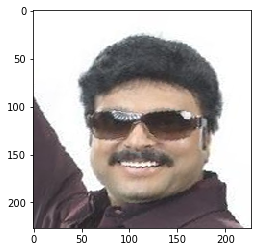

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


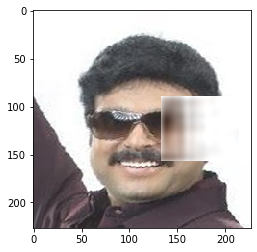

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


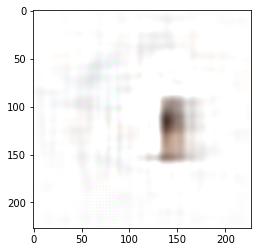

Epoch:22 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010370, mse: 0.010380]
Epoch:22 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012452, mse: 0.012464]
Epoch:22 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011718, mse: 0.011730]
Epoch:22 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012644, mse: 0.012657]
Epoch:22 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011425, mse: 0.011436]
Epoch:22 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011141, mse: 0.011152]
Epoch:22 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014458, mse: 0.014472]
Epoch:22 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016524, mse: 0.016540]
Epoch:22 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010647, mse: 0.010658]
Epoch:22 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011965, mse: 0.011977]
Epoch:22 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015919, mse:

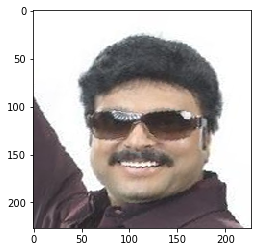

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


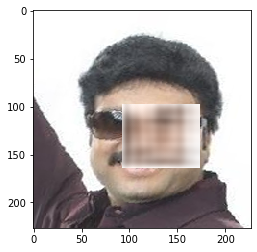

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


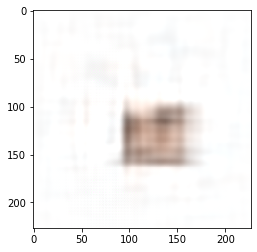

Epoch:23 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013329, mse: 0.013343]
Epoch:23 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010820, mse: 0.010831]
Epoch:23 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.020129, mse: 0.020149]
Epoch:23 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009889, mse: 0.009899]
Epoch:23 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011875, mse: 0.011887]
Epoch:23 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010928, mse: 0.010939]
Epoch:23 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011498, mse: 0.011509]
Epoch:23 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009612, mse: 0.009622]
Epoch:23 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011579, mse: 0.011591]
Epoch:23 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013543, mse: 0.013556]
Epoch:23 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009859, mse:

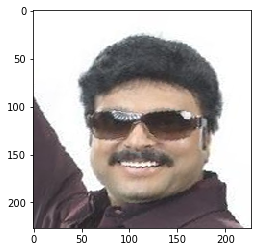

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


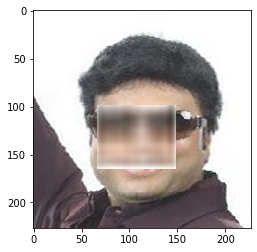

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


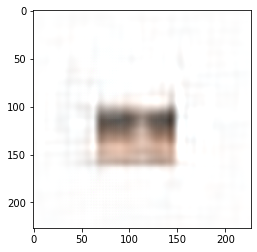

Epoch:24 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010742, mse: 0.010753]
Epoch:24 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008898, mse: 0.008907]
Epoch:24 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011958, mse: 0.011970]
Epoch:24 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012782, mse: 0.012795]
Epoch:24 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010671, mse: 0.010681]
Epoch:24 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010889, mse: 0.010900]
Epoch:24 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012079, mse: 0.012091]
Epoch:24 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019315, mse: 0.019334]
Epoch:24 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012175, mse: 0.012187]
Epoch:24 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011473, mse: 0.011484]
Epoch:24 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010699, mse:

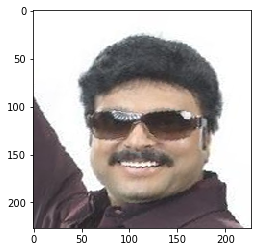

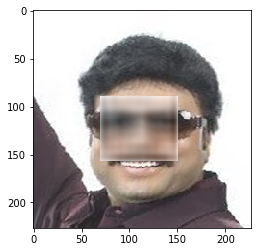

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


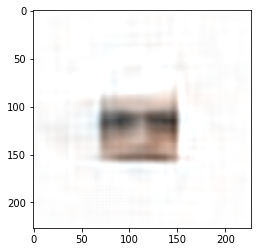

Epoch:25 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012902, mse: 0.012915]
Epoch:25 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013406, mse: 0.013419]
Epoch:25 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015945, mse: 0.015961]
Epoch:25 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012598, mse: 0.012611]
Epoch:25 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015074, mse: 0.015089]
Epoch:25 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016817, mse: 0.016834]
Epoch:25 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015624, mse: 0.015640]
Epoch:25 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015093, mse: 0.015108]
Epoch:25 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010706, mse: 0.010717]
Epoch:25 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010143, mse: 0.010153]
Epoch:25 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014441, mse:

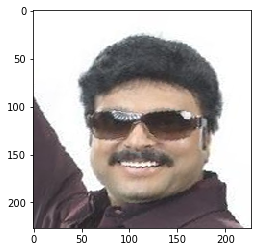

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


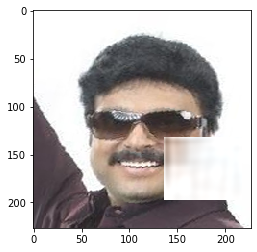

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


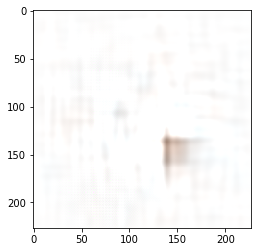

Epoch:26 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010137, mse: 0.010147]
Epoch:26 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009073, mse: 0.009082]
Epoch:26 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013234, mse: 0.013248]
Epoch:26 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011264, mse: 0.011275]
Epoch:26 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017851, mse: 0.017869]
Epoch:26 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010361, mse: 0.010371]
Epoch:26 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009885, mse: 0.009895]
Epoch:26 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011464, mse: 0.011475]
Epoch:26 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012382, mse: 0.012395]
Epoch:26 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009423, mse: 0.009433]
Epoch:26 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010208, mse:

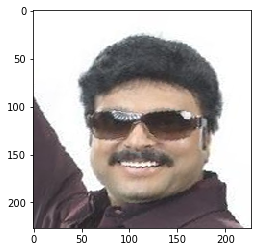

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


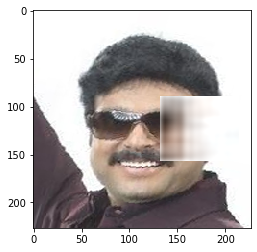

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


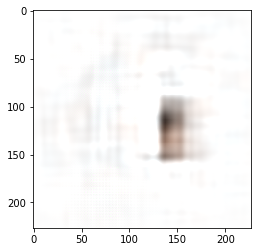

Epoch:27 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008399, mse: 0.008407]
Epoch:27 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011117, mse: 0.011128]
Epoch:27 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012166, mse: 0.012178]
Epoch:27 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012451, mse: 0.012463]
Epoch:27 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015790, mse: 0.015806]
Epoch:27 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010051, mse: 0.010061]
Epoch:27 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011190, mse: 0.011201]
Epoch:27 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012079, mse: 0.012092]
Epoch:27 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009722, mse: 0.009732]
Epoch:27 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028430, mse: 0.028459]
Epoch:27 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010384, mse:

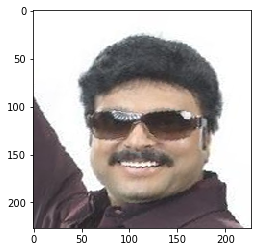

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


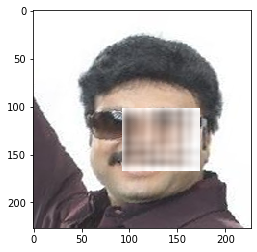

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


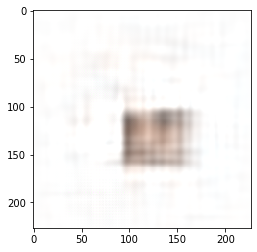

Epoch:28 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011285, mse: 0.011297]
Epoch:28 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019188, mse: 0.019207]
Epoch:28 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014491, mse: 0.014505]
Epoch:28 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013021, mse: 0.013034]
Epoch:28 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013657, mse: 0.013670]
Epoch:28 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009513, mse: 0.009522]
Epoch:28 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011852, mse: 0.011864]
Epoch:28 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008453, mse: 0.008461]
Epoch:28 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013325, mse: 0.013338]
Epoch:28 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011115, mse: 0.011127]
Epoch:28 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010922, mse:

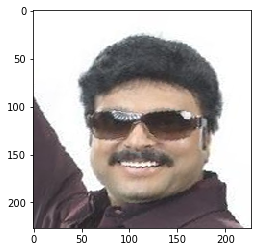

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


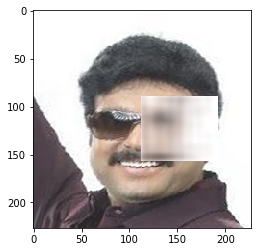

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


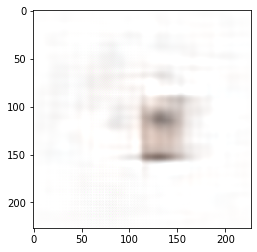

Epoch:29 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017489, mse: 0.017507]
Epoch:29 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009698, mse: 0.009708]
Epoch:29 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.058476, mse: 0.058535]
Epoch:29 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009826, mse: 0.009836]
Epoch:29 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010444, mse: 0.010454]
Epoch:29 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015005, mse: 0.015020]
Epoch:29 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009593, mse: 0.009602]
Epoch:29 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017684, mse: 0.017701]
Epoch:29 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007857, mse: 0.007864]
Epoch:29 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015630, mse: 0.015646]
Epoch:29 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021129, mse:

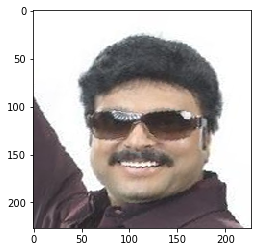

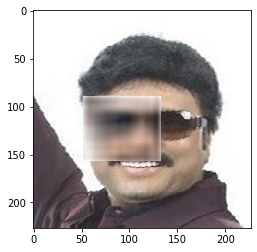

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


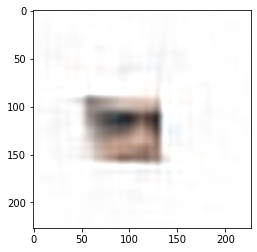

Epoch:30 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008742, mse: 0.008751]
Epoch:30 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015516, mse: 0.015531]
Epoch:30 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011105, mse: 0.011117]
Epoch:30 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017452, mse: 0.017469]
Epoch:30 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007993, mse: 0.008001]
Epoch:30 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009030, mse: 0.009039]
Epoch:30 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008916, mse: 0.008925]
Epoch:30 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008868, mse: 0.008876]
Epoch:30 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009550, mse: 0.009560]
Epoch:30 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011111, mse: 0.011122]
Epoch:30 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.040640, mse:

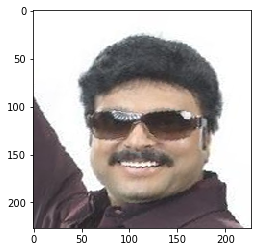

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


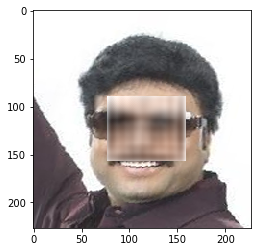

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


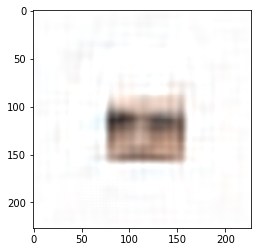

Epoch:31 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007671, mse: 0.007679]
Epoch:31 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011648, mse: 0.011659]
Epoch:31 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011525, mse: 0.011536]
Epoch:31 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.059428, mse: 0.059488]
Epoch:31 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011032, mse: 0.011043]
Epoch:31 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008676, mse: 0.008685]
Epoch:31 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012623, mse: 0.012635]
Epoch:31 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009475, mse: 0.009484]
Epoch:31 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009867, mse: 0.009877]
Epoch:31 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012497, mse: 0.012510]
Epoch:31 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009704, mse:

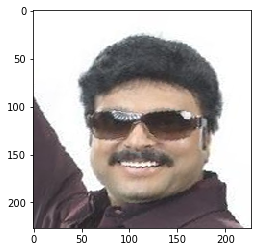

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


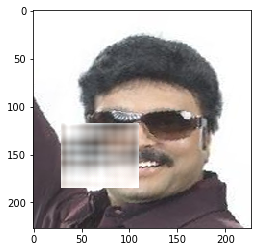

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


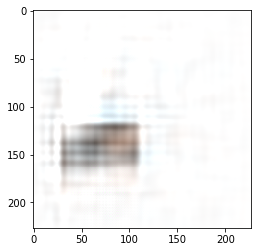

Epoch:32 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013137, mse: 0.013150]
Epoch:32 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010594, mse: 0.010605]
Epoch:32 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.018817, mse: 0.018836]
Epoch:32 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011674, mse: 0.011686]
Epoch:32 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010080, mse: 0.010090]
Epoch:32 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008182, mse: 0.008190]
Epoch:32 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016797, mse: 0.016813]
Epoch:32 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008839, mse: 0.008848]
Epoch:32 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010046, mse: 0.010056]
Epoch:32 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011011, mse: 0.011022]
Epoch:32 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010567, mse:

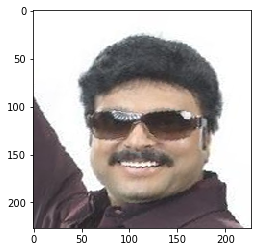

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


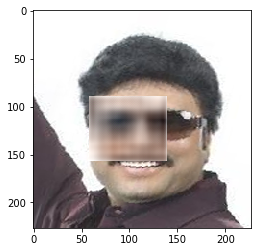

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


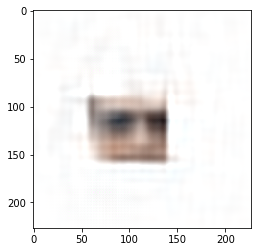

Epoch:33 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010049, mse: 0.010059]
Epoch:33 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010393, mse: 0.010403]
Epoch:33 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010758, mse: 0.010768]
Epoch:33 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010009, mse: 0.010019]
Epoch:33 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011198, mse: 0.011209]
Epoch:33 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010401, mse: 0.010412]
Epoch:33 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008744, mse: 0.008753]
Epoch:33 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013813, mse: 0.013827]
Epoch:33 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.032812, mse: 0.032845]
Epoch:33 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010714, mse: 0.010725]
Epoch:33 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010312, mse:

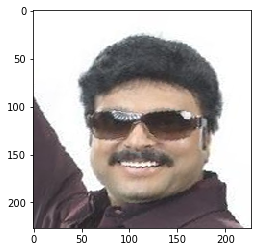

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


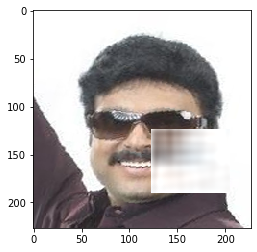

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


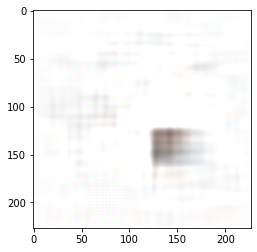

Epoch:34 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008063, mse: 0.008071]
Epoch:34 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013594, mse: 0.013607]
Epoch:34 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010642, mse: 0.010653]
Epoch:34 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011590, mse: 0.011602]
Epoch:34 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013026, mse: 0.013039]
Epoch:34 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011971, mse: 0.011983]
Epoch:34 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014299, mse: 0.014313]
Epoch:34 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008922, mse: 0.008931]
Epoch:34 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.042411, mse: 0.042453]
Epoch:34 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008295, mse: 0.008304]
Epoch:34 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.048296, mse:

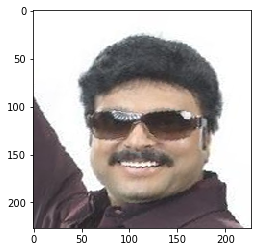

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


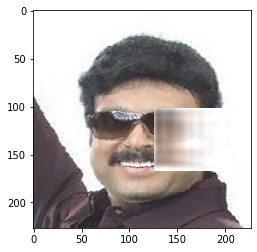

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


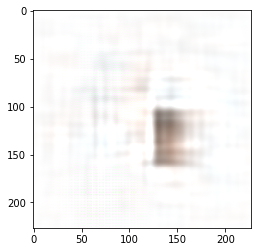

Epoch:35 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010536, mse: 0.010547]
Epoch:35 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010696, mse: 0.010707]
Epoch:35 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010252, mse: 0.010263]
Epoch:35 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021540, mse: 0.021562]
Epoch:35 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008789, mse: 0.008798]
Epoch:35 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008522, mse: 0.008530]
Epoch:35 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011480, mse: 0.011492]
Epoch:35 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012605, mse: 0.012618]
Epoch:35 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009192, mse: 0.009202]
Epoch:35 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011012, mse: 0.011023]
Epoch:35 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012228, mse:

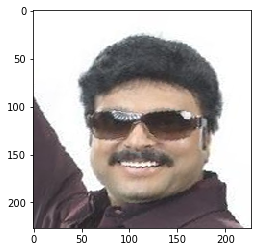

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


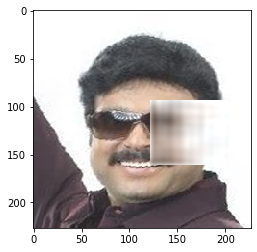

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


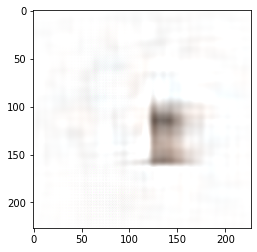

Epoch:36 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010751, mse: 0.010762]
Epoch:36 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012062, mse: 0.012074]
Epoch:36 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006529, mse: 0.006535]
Epoch:36 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010291, mse: 0.010301]
Epoch:36 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.027826, mse: 0.027854]
Epoch:36 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009842, mse: 0.009852]
Epoch:36 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011023, mse: 0.011034]
Epoch:36 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.027702, mse: 0.027730]
Epoch:36 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012561, mse: 0.012573]
Epoch:36 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008700, mse: 0.008709]
Epoch:36 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011028, mse:

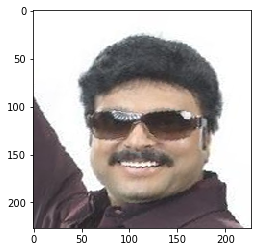

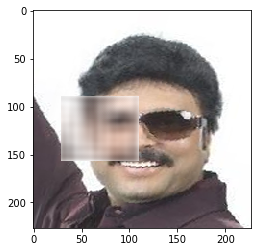

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


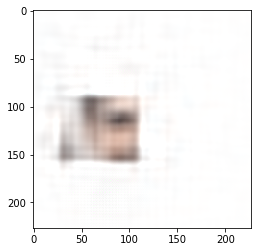

Epoch:37 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011254, mse: 0.011266]
Epoch:37 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010750, mse: 0.010760]
Epoch:37 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009893, mse: 0.009903]
Epoch:37 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008550, mse: 0.008558]
Epoch:37 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010368, mse: 0.010379]
Epoch:37 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010718, mse: 0.010729]
Epoch:37 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016395, mse: 0.016411]
Epoch:37 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008362, mse: 0.008370]
Epoch:37 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009735, mse: 0.009745]
Epoch:37 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013610, mse: 0.013623]
Epoch:37 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011852, mse:

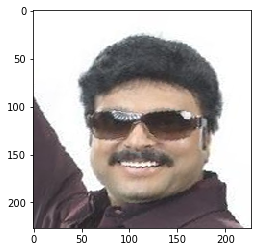

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


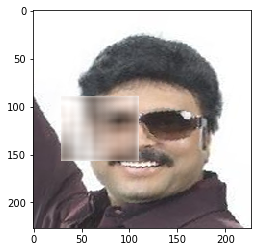

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


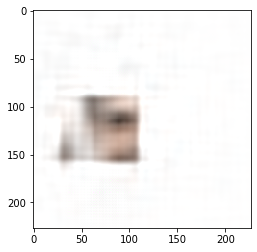

Epoch:38 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009252, mse: 0.009261]
Epoch:38 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010444, mse: 0.010455]
Epoch:38 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011253, mse: 0.011264]
Epoch:38 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012204, mse: 0.012216]
Epoch:38 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009582, mse: 0.009592]
Epoch:38 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013517, mse: 0.013530]
Epoch:38 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007976, mse: 0.007984]
Epoch:38 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010655, mse: 0.010666]
Epoch:38 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010387, mse: 0.010397]
Epoch:38 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012721, mse: 0.012734]
Epoch:38 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015060, mse:

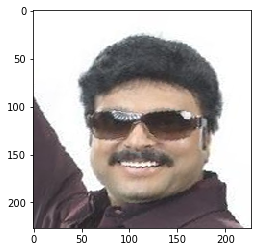

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


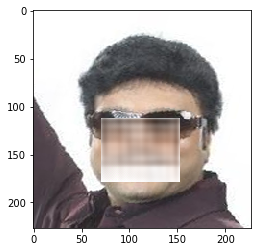

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


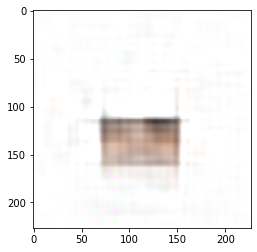

Epoch:39 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012033, mse: 0.012045]
Epoch:39 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013248, mse: 0.013261]
Epoch:39 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010291, mse: 0.010302]
Epoch:39 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006766, mse: 0.006773]
Epoch:39 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007378, mse: 0.007386]
Epoch:39 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009530, mse: 0.009539]
Epoch:39 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009579, mse: 0.009588]
Epoch:39 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009801, mse: 0.009811]
Epoch:39 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015150, mse: 0.015165]
Epoch:39 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008658, mse: 0.008667]
Epoch:39 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009701, mse:

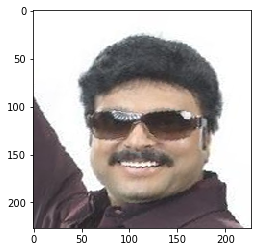

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


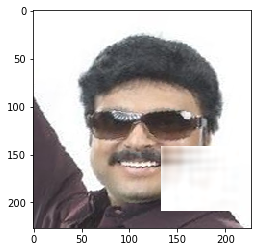

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


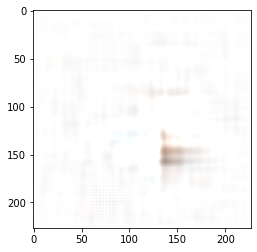

Epoch:40 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010370, mse: 0.010380]
Epoch:40 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009016, mse: 0.009025]
Epoch:40 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009004, mse: 0.009013]
Epoch:40 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009300, mse: 0.009309]
Epoch:40 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019132, mse: 0.019151]
Epoch:40 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007772, mse: 0.007779]
Epoch:40 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009641, mse: 0.009650]
Epoch:40 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019638, mse: 0.019657]
Epoch:40 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009062, mse: 0.009071]
Epoch:40 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012595, mse: 0.012608]
Epoch:40 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009769, mse:

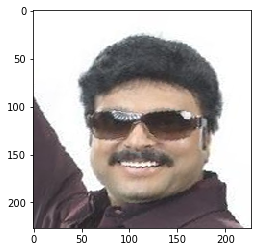

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


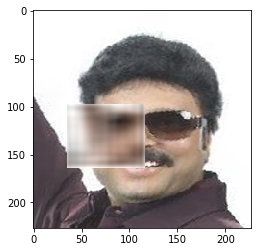

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


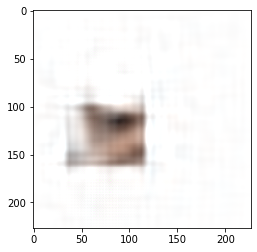

Epoch:41 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009741, mse: 0.009751]
Epoch:41 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011060, mse: 0.011071]
Epoch:41 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008621, mse: 0.008629]
Epoch:41 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016346, mse: 0.016363]
Epoch:41 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008933, mse: 0.008941]
Epoch:41 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010817, mse: 0.010828]
Epoch:41 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.033843, mse: 0.033877]
Epoch:41 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011777, mse: 0.011788]
Epoch:41 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008593, mse: 0.008602]
Epoch:41 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010564, mse: 0.010574]
Epoch:41 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.057505, mse:

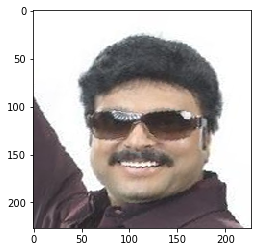

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


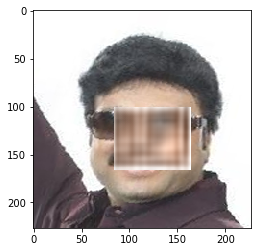

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


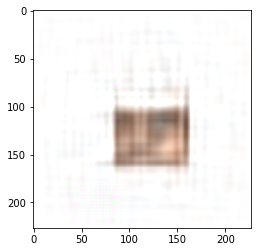

Epoch:42 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010936, mse: 0.010947]
Epoch:42 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011676, mse: 0.011688]
Epoch:42 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010357, mse: 0.010368]
Epoch:42 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021275, mse: 0.021296]
Epoch:42 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011702, mse: 0.011714]
Epoch:42 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009376, mse: 0.009385]
Epoch:42 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007834, mse: 0.007842]
Epoch:42 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007562, mse: 0.007570]
Epoch:42 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010585, mse: 0.010595]
Epoch:42 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011523, mse: 0.011535]
Epoch:42 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006740, mse:

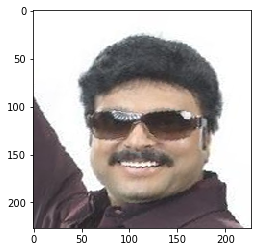

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


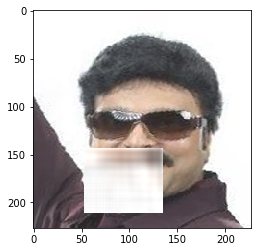

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


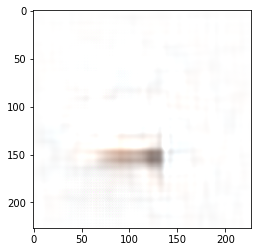

Epoch:43 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.035186, mse: 0.035221]
Epoch:43 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011869, mse: 0.011880]
Epoch:43 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008963, mse: 0.008972]
Epoch:43 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009396, mse: 0.009405]
Epoch:43 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006743, mse: 0.006750]
Epoch:43 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012630, mse: 0.012642]
Epoch:43 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010808, mse: 0.010818]
Epoch:43 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010094, mse: 0.010104]
Epoch:43 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009341, mse: 0.009350]
Epoch:43 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011019, mse: 0.011030]
Epoch:43 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015129, mse:

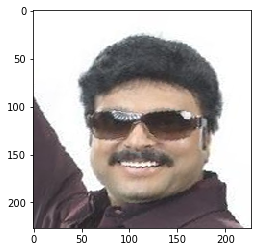

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


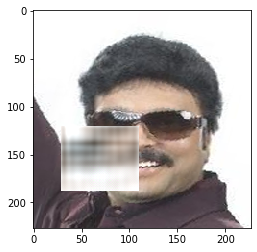

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


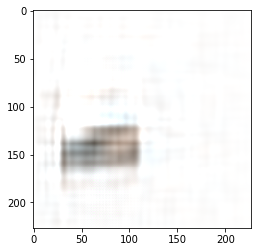

Epoch:44 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.023355, mse: 0.023379]
Epoch:44 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012503, mse: 0.012515]
Epoch:44 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008440, mse: 0.008449]
Epoch:44 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007295, mse: 0.007302]
Epoch:44 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010824, mse: 0.010834]
Epoch:44 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009622, mse: 0.009632]
Epoch:44 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014137, mse: 0.014152]
Epoch:44 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007753, mse: 0.007761]
Epoch:44 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008799, mse: 0.008808]
Epoch:44 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.034025, mse: 0.034059]
Epoch:44 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008934, mse:

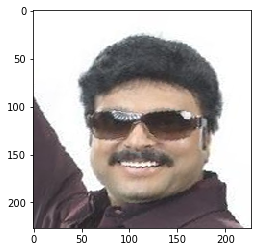

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


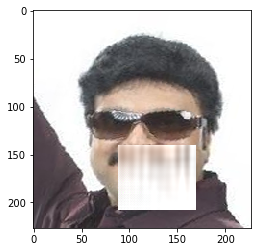

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


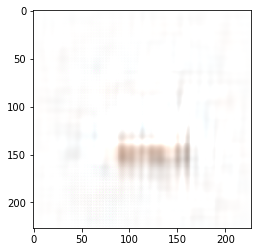

Epoch:45 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022624, mse: 0.022646]
Epoch:45 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014175, mse: 0.014189]
Epoch:45 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008066, mse: 0.008074]
Epoch:45 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012165, mse: 0.012177]
Epoch:45 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008037, mse: 0.008045]
Epoch:45 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010194, mse: 0.010204]
Epoch:45 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012347, mse: 0.012360]
Epoch:45 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019057, mse: 0.019076]
Epoch:45 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010003, mse: 0.010013]
Epoch:45 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008700, mse: 0.008709]
Epoch:45 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012687, mse:

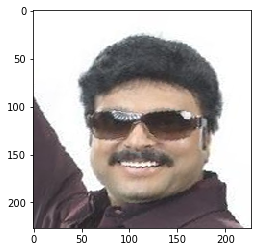

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


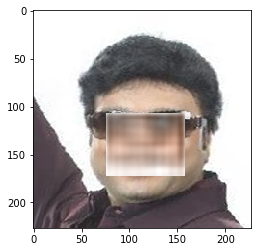

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


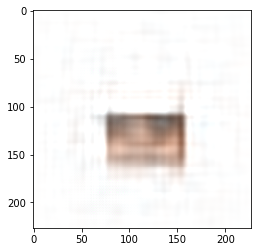

Epoch:46 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010471, mse: 0.010481]
Epoch:46 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012014, mse: 0.012026]
Epoch:46 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007313, mse: 0.007320]
Epoch:46 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007636, mse: 0.007643]
Epoch:46 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009454, mse: 0.009464]
Epoch:46 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008558, mse: 0.008567]
Epoch:46 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.027550, mse: 0.027578]
Epoch:46 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010428, mse: 0.010439]
Epoch:46 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010252, mse: 0.010263]
Epoch:46 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009311, mse: 0.009321]
Epoch:46 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010779, mse:

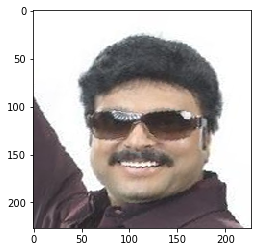

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


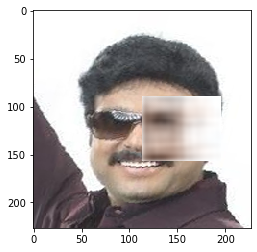

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


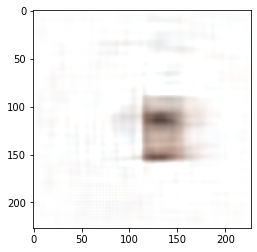

Epoch:47 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011070, mse: 0.011081]
Epoch:47 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008852, mse: 0.008860]
Epoch:47 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012151, mse: 0.012163]
Epoch:47 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011808, mse: 0.011820]
Epoch:47 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.043875, mse: 0.043919]
Epoch:47 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008740, mse: 0.008749]
Epoch:47 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012466, mse: 0.012479]
Epoch:47 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013533, mse: 0.013546]
Epoch:47 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009097, mse: 0.009106]
Epoch:47 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009272, mse: 0.009281]
Epoch:47 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008895, mse:

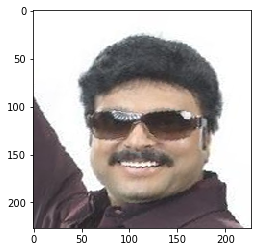

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


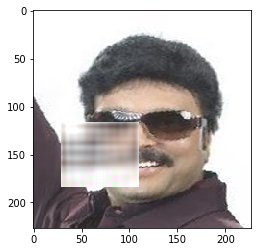

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


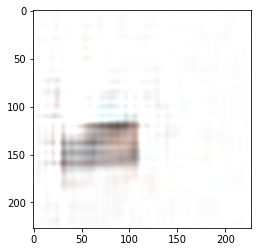

Epoch:48 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010275, mse: 0.010286]
Epoch:48 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009037, mse: 0.009046]
Epoch:48 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008604, mse: 0.008613]
Epoch:48 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008805, mse: 0.008814]
Epoch:48 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010675, mse: 0.010686]
Epoch:48 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010118, mse: 0.010129]
Epoch:48 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.024327, mse: 0.024351]
Epoch:48 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009632, mse: 0.009641]
Epoch:48 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006831, mse: 0.006838]
Epoch:48 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011348, mse: 0.011359]
Epoch:48 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009662, mse:

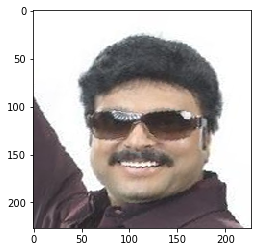

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


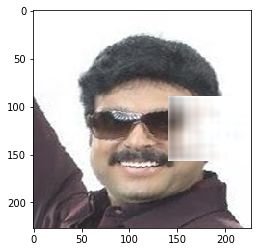

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


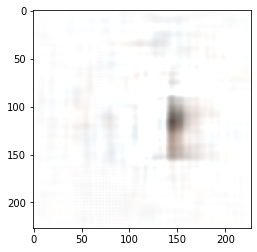

Epoch:49 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010370, mse: 0.010380]
Epoch:49 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009967, mse: 0.009977]
Epoch:49 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016263, mse: 0.016279]
Epoch:49 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011806, mse: 0.011817]
Epoch:49 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009226, mse: 0.009235]
Epoch:49 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009201, mse: 0.009211]
Epoch:49 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006382, mse: 0.006388]
Epoch:49 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008443, mse: 0.008451]
Epoch:49 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011031, mse: 0.011042]
Epoch:49 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010663, mse: 0.010674]
Epoch:49 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009791, mse:

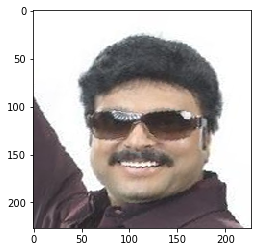

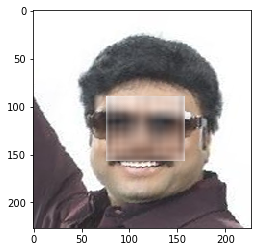

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


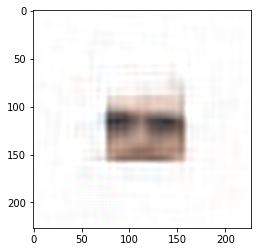

Epoch:50 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010119, mse: 0.010129]
Epoch:50 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012472, mse: 0.012485]
Epoch:50 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008634, mse: 0.008643]
Epoch:50 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011013, mse: 0.011024]
Epoch:50 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022117, mse: 0.022139]
Epoch:50 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011645, mse: 0.011656]
Epoch:50 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009530, mse: 0.009540]
Epoch:50 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010729, mse: 0.010740]
Epoch:50 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017331, mse: 0.017348]
Epoch:50 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008226, mse: 0.008235]
Epoch:50 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010159, mse:

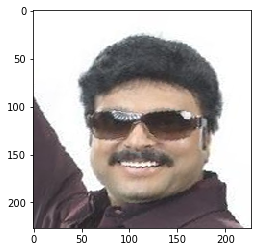

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


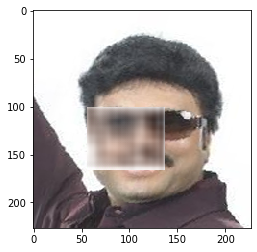

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


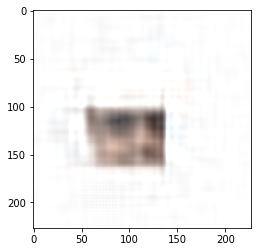

Epoch:51 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013248, mse: 0.013261]
Epoch:51 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007323, mse: 0.007330]
Epoch:51 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019610, mse: 0.019630]
Epoch:51 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017998, mse: 0.018016]
Epoch:51 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012263, mse: 0.012275]
Epoch:51 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009316, mse: 0.009325]
Epoch:51 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007747, mse: 0.007755]
Epoch:51 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.028418, mse: 0.028447]
Epoch:51 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009945, mse: 0.009955]
Epoch:51 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011409, mse: 0.011420]
Epoch:51 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008022, mse:

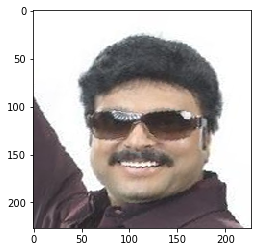

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


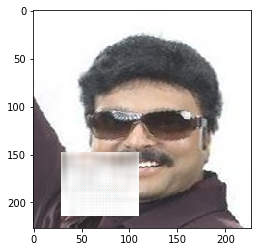

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


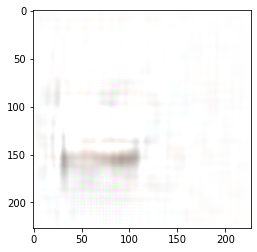

Epoch:52 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010696, mse: 0.010706]
Epoch:52 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011675, mse: 0.011687]
Epoch:52 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007777, mse: 0.007785]
Epoch:52 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009407, mse: 0.009417]
Epoch:52 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007501, mse: 0.007509]
Epoch:52 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006759, mse: 0.006766]
Epoch:52 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011993, mse: 0.012005]
Epoch:52 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007769, mse: 0.007777]
Epoch:52 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021667, mse: 0.021689]
Epoch:52 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006994, mse: 0.007001]
Epoch:52 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008262, mse:

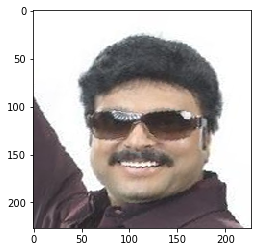

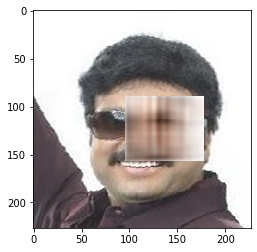

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


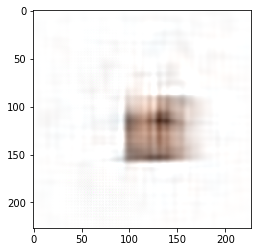

Epoch:53 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009692, mse: 0.009702]
Epoch:53 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.014033, mse: 0.014047]
Epoch:53 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010335, mse: 0.010345]
Epoch:53 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007306, mse: 0.007313]
Epoch:53 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015828, mse: 0.015844]
Epoch:53 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008173, mse: 0.008182]
Epoch:53 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.031452, mse: 0.031483]
Epoch:53 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.017868, mse: 0.017886]
Epoch:53 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008160, mse: 0.008168]
Epoch:53 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010278, mse: 0.010288]
Epoch:53 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008296, mse:

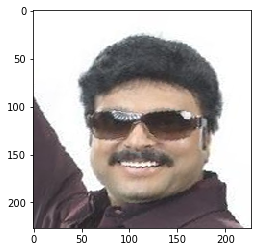

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


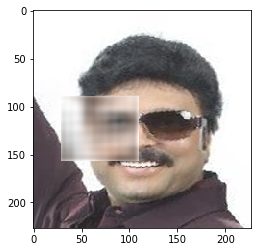

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


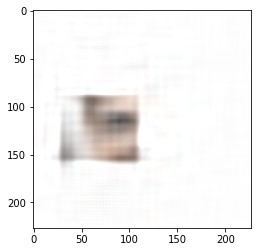

Epoch:54 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009626, mse: 0.009636]
Epoch:54 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.016789, mse: 0.016805]
Epoch:54 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022628, mse: 0.022651]
Epoch:54 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011190, mse: 0.011202]
Epoch:54 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.018318, mse: 0.018336]
Epoch:54 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009568, mse: 0.009578]
Epoch:54 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011229, mse: 0.011240]
Epoch:54 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009847, mse: 0.009856]
Epoch:54 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012011, mse: 0.012023]
Epoch:54 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010647, mse: 0.010658]
Epoch:54 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007375, mse:

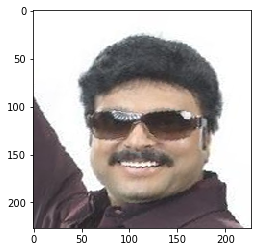

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


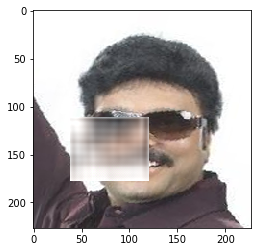

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


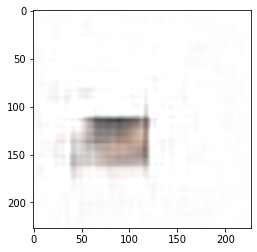

Epoch:55 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009658, mse: 0.009668]
Epoch:55 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.019505, mse: 0.019524]
Epoch:55 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.015840, mse: 0.015856]
Epoch:55 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012287, mse: 0.012300]
Epoch:55 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008227, mse: 0.008235]
Epoch:55 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009621, mse: 0.009631]
Epoch:55 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.013744, mse: 0.013757]
Epoch:55 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.031175, mse: 0.031206]
Epoch:55 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010521, mse: 0.010532]
Epoch:55 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.011768, mse: 0.011780]
Epoch:55 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010360, mse:

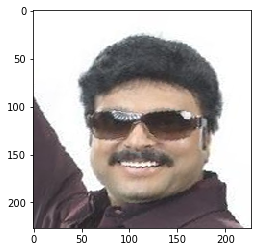

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


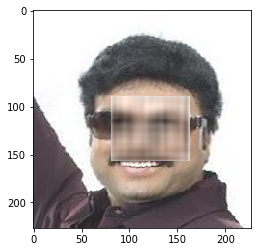

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


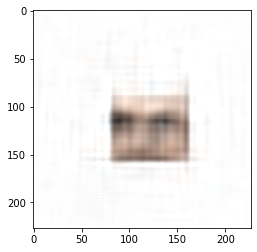

Epoch:56 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.008872, mse: 0.008881]
Epoch:56 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009302, mse: 0.009311]
Epoch:56 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.010262, mse: 0.010272]
Epoch:56 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.021287, mse: 0.021308]
Epoch:56 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009817, mse: 0.009827]
Epoch:56 Batches:501/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022629, mse: 0.022652]
Epoch:56 Batches:601/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.006849, mse: 0.006856]
Epoch:56 Batches:701/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009042, mse: 0.009051]
Epoch:56 Batches:801/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009990, mse: 0.010000]
Epoch:56 Batches:901/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.012097, mse: 0.012109]
Epoch:56 Batches:1001/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.022182, mse:

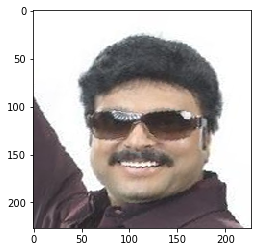

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


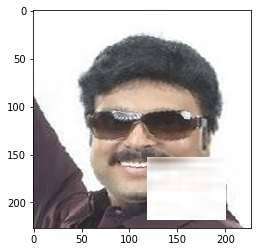

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


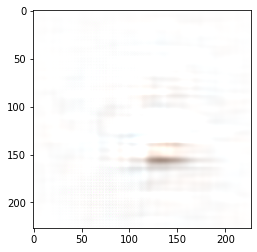

Epoch:57 Batches:1/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009710, mse: 0.009719]
Epoch:57 Batches:101/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007541, mse: 0.007549]
Epoch:57 Batches:201/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.007293, mse: 0.007301]
Epoch:57 Batches:301/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009452, mse: 0.009461]
Epoch:57 Batches:401/1053 [D loss: 7.712474, acc: 50.00%] [G loss: 0.009642, mse: 0.009651]


In [0]:
combined_model.summary()
epochs = 100
dataGenerator = DataStorage("./img_align_celeba_mustache_png", mode='random')
testDataGenerator = DataStorage("test", batch_size=8, mode='random_mustache_mask')
batches_in_epoch = dataGenerator.get_batches_count()
for epoch in range(epochs):
    for i in range(batches_in_epoch):
        a, masked_images, masked_parts_of_images , b, c = dataGenerator.get_next_batch()
        true_y_masks = [1 for e in masked_parts_of_images]

        gen_masked = Generator.predict([masked_images])
        false_y_masks = [0 for e in gen_masked]
        
        # Train Discriminator
        d_loss_real = Discriminator.train_on_batch([masked_parts_of_images], true_y_masks)
        d_loss_fake = Discriminator.train_on_batch([gen_masked], false_y_masks)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # Train Generator
        g_loss = combined_model.train_on_batch([masked_images], [masked_parts_of_images, false_y_masks])

        if i % 100 == 0:
            print("Epoch:%d Batches:%d/%d [D loss: %f, acc: %.2f%%] [G loss: %f, mse: %f]" % (epoch, i+1,batches_in_epoch, d_loss[0], 100*d_loss[1], g_loss[0], g_loss[1]))

    images, masked_images, masked_parts_of_images , y_ranges, x_ranges = testDataGenerator.get_next_batch()
    gen_masks = Generator.predict([masked_images])
    print(type(gen_masks))

    print(y_ranges)
    print(x_ranges)

    for i, img in enumerate(gen_masks):
        y_range = y_ranges[i]
        x_range = x_ranges[i]

        for y in range(y_range[0], y_range[1]):
            for x in range(x_range[0], x_range[1]):
                masked_images[i][y, x, :] = img[y, x, :]
        
        plt.imshow(images[i])
        plt.show()
        
        plt.imshow(masked_images[i]*0.5+0.5)
        plt.show()
        
        plt.imshow(img*0.5+0.5)
        plt.show()

    if epoch % 10 == 0:        
        Discriminator.save('dis1.h5')
        Generator.save('gen1.h5')

In [0]:
Discriminator.save('dis1.h5')
Generator.save('gen1.h5')

In [0]:
testDataGenerator = DataStorage("test", batch_size=8, mode='random_mustache_mask')

In [0]:
testDataGenerator.get_batches_count

<bound method DataStorage.get_batches_count of <__main__.DataStorage object at 0x7fe0c5a6b400>>